## Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from config import PathConfig
from os.path import join

import torch
import torch.nn as nn
import torch.optim as optim
import random
from collections import deque

## Load Bitcoin data

In [2]:
from data_processor.data_preprocessor import DataPreprocessor
from data_processor.reader import read_raw_data

In [3]:
data = read_raw_data(coin_name='BTC')
data_preprocessor = DataPreprocessor(data)
data_preprocessor.load_preprocessed_data()
train_data = data_preprocessor.train_data
train_data.head()

Preprocessed data and transformation objects loaded successfully!


,open,high,low,close,volume,rsi,macd
0,-0.112975,-0.111700,-0.112901,-0.111297,-0.695475,-0.728140,0.471585
1,-0.111018,-0.111003,-0.110644,-0.110530,-0.693837,-0.668692,0.447718
2,-0.110254,-0.109966,-0.111556,-0.110463,-0.554987,-0.663235,0.434679
3,-0.110179,-0.108928,-0.110607,-0.109198,-0.566861,-0.555434,0.458243
4,-0.108914,-0.109758,-0.110583,-0.109620,-0.723963,-0.582056,0.460094


## Defining the Markov Decision Process (MDP):

* State Space (S): Define the state space as a matrix of selected features representing the environment. Each state corresponds to an hourly snapshot of these features.
* Action Space (A): Define the action space with three possible actions: Increase (predicting the price will go up), Decrease (predicting the price will go down), and No-Change (predicting the price will remain stable).
* Reward Function (R): Design a reward function that penalizes incorrect predictions and rewards accurate ones. The reward function should reflect real-world trading outcomes and include components such as predictive accuracy incentive, confidence-adjusted scaling, penalties for consecutive errors, and a time-based discounting factor.

In [7]:
FEATURES = ['open', 'high', 'low', 'close', 'volume', 'rsi', 'macd']
ACTIONS = ['increase', 'decrease']

class BitcoinEnv:
    def __init__(self, data):
        self.data = data
        self.current_step = 0
    
    def reset(self):
        self.current_step = 0
        return self.get_state()
    
    def step(self, action):
        reward = self.get_reward(action)
        self.current_step += 1
        next_state = self.get_state()
        done = self.current_step >= len(self.data) - 1
        return next_state, reward, done
    
    def get_state(self):
        state = self.data.iloc[self.current_step][FEATURES].values
        return state
    
    def get_reward(self, action):
        current_price = self.data.iloc[self.current_step]['close']
        next_price = self.data.iloc[self.current_step + 1]['close'] if self.current_step < len(self.data) - 1 else current_price
        
        if action == 0:  # 'increase'
            reward = 1 if next_price > current_price else -1
        else:  # 'decrease'
            reward = 1 if next_price < current_price else -1
        
        return reward

In [8]:
bitcoin_env = BitcoinEnv(train_data)
bitcoin_env.get_state()

array([-0.11297457, -0.11170048, -0.11290092, -0.11129736, -0.69547519,
       -0.7281398 ,  0.47158463])

## Q-Network Architecture

The agent will use a neural network to predict Q-values for each action and update its policy based on the rewards received from the environment.

In [9]:
class SimpleDQN(nn.Module):
    def __init__(self, state_size, action_size):
        super(SimpleDQN, self).__init__()
        self.fc1 = nn.Linear(state_size, 64)
        self.fc2 = nn.Linear(64, 64)
        self.fc3 = nn.Linear(64, action_size)
    
    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x
    
class ComplexDQN(nn.Module):
    def __init__(self, state_size, action_size):
        super(ComplexDQN, self).__init__()
        self.fc1 = nn.Linear(state_size, 128)
        self.fc2 = nn.Linear(128, 128)
        self.fc3 = nn.Linear(128, action_size)
    
    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

## Experience Replay
Implement experience replay to store past experiences and sample minibatches for training

In [10]:
class ReplayMemory:
    def __init__(self, capacity):
        self.memory = deque(maxlen=capacity)
    
    def push(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))
    
    def sample(self, batch_size):
        return random.sample(self.memory, batch_size)
    
    def __len__(self):
        return len(self.memory)

## DQN Agent Class

In [23]:
class DQNAgent:
    def __init__(self, q_architecture, state_size, action_size, gamma=0.99, epsilon=1.0, epsilon_min=0.01, epsilon_decay=0.995, lr=0.001, memory_size=10000, batch_size=32):
        self.state_size = state_size
        self.action_size = action_size
        self.gamma = gamma
        self.epsilon = epsilon
        self.epsilon_min = epsilon_min
        self.epsilon_decay = epsilon_decay
        self.batch_size = batch_size
        
        self.memory = ReplayMemory(memory_size)
        self.model = q_architecture(state_size, action_size)
        self.target_model = q_architecture(state_size, action_size)
        self.update_target_model()
        
        self.optimizer = optim.Adam(self.model.parameters(), lr=lr)
        self.loss_fn = nn.MSELoss()
    
    def update_target_model(self):
        self.target_model.load_state_dict(self.model.state_dict())
    
    def act(self, state):
        if np.random.rand() <= self.epsilon:
            return random.randrange(self.action_size)
        state = torch.FloatTensor(np.array(state, dtype=np.float32)).unsqueeze(0)
        act_values = self.model(state)
        return torch.argmax(act_values[0]).item()
    
    def remember(self, state, action, reward, next_state, done):
        self.memory.push(state, action, reward, next_state, done)
    
    def replay(self):
        if len(self.memory) < self.batch_size:
            return
        
        minibatch = self.memory.sample(self.batch_size)
        
        for state, action, reward, next_state, done in minibatch:
            state = torch.FloatTensor(np.array(state, dtype=np.float32))
            next_state = torch.FloatTensor(np.array(next_state, dtype=np.float32))
            reward = torch.FloatTensor([reward])
            target = reward
            if not done:
                target = reward + self.gamma * torch.max(self.target_model(next_state))
            target_f = self.model(state)
            target_f[action] = target
            self.optimizer.zero_grad()
            loss = self.loss_fn(target_f, self.model(state))
            loss.backward()
            self.optimizer.step()
        
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay
    
    def save_model(self,):
        torch.save(self.model.state_dict(), join(PathConfig.model_path.value, "dqn_agent.pth"))
        print(f"Model instance saved successfully in file: {self.model_name}.pth")

## Training with Target Network

In [24]:
import matplotlib.pyplot as plt
import os

def train_dqn(agent, env, steps_per_episode=50, n_episodes=10, plot_path=join(PathConfig.metric_plots_path.value, 'rnn_models', f'agent_test_plot.png')):
    rewards_per_episode = []
    epsilon_per_episode = []

    for e in range(n_episodes):
        state = env.reset()
        total_reward = 0
        for time in range(steps_per_episode):  # Limit to 500 steps per episode
            action = agent.act(state)
            next_state, reward, done = env.step(action)
            agent.remember(state, action, reward, next_state, done)
            state = next_state
            total_reward += reward
            
            print(f"Episode: {e+1}/{n_episodes}, Step: {time+1}, Action: {ACTIONS[action]}, Reward: {reward}, Total Reward: {total_reward}, Epsilon: {agent.epsilon:.2f}")
            
            if done:
                agent.update_target_model()
                print(f"End of Episode: {e+1}/{n_episodes}, Total Score: {total_reward}, Epsilon: {agent.epsilon:.2f}")
                break
            agent.replay()

        rewards_per_episode.append(total_reward)
        epsilon_per_episode.append(agent.epsilon)

    plot_metrics(rewards_per_episode, epsilon_per_episode, plot_path)

    return rewards_per_episode, epsilon_per_episode, agent

def plot_metrics(rewards_per_episode, epsilon_per_episode, plot_path):
    fig, ax1 = plt.subplots(figsize=(12, 6))

    ax1.set_xlabel('Episode')
    ax1.set_ylabel('Total Reward', color='tab:blue')
    ax1.plot(rewards_per_episode, label='Total Reward per Episode', color='tab:blue')
    ax1.tick_params(axis='y', labelcolor='tab:blue')

    ax2 = ax1.twinx()
    ax2.set_ylabel('Epsilon', color='tab:orange')
    ax2.plot(epsilon_per_episode, label='Epsilon Value per Episode', color='tab:orange')
    ax2.tick_params(axis='y', labelcolor='tab:orange')

    fig.tight_layout()
    # if save_path:
    #     plt.savefig(plot_path)
    plt.show()
    plt.close()

Episode: 1/10, Step: 1, Action: decrease, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/10, Step: 2, Action: increase, Reward: 1, Total Reward: 0, Epsilon: 1.00
Episode: 1/10, Step: 3, Action: decrease, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/10, Step: 4, Action: decrease, Reward: 1, Total Reward: 0, Epsilon: 1.00
Episode: 1/10, Step: 5, Action: increase, Reward: 1, Total Reward: 1, Epsilon: 1.00
Episode: 1/10, Step: 6, Action: decrease, Reward: 1, Total Reward: 2, Epsilon: 1.00
Episode: 1/10, Step: 7, Action: decrease, Reward: 1, Total Reward: 3, Epsilon: 1.00
Episode: 1/10, Step: 8, Action: increase, Reward: -1, Total Reward: 2, Epsilon: 1.00
Episode: 1/10, Step: 9, Action: increase, Reward: -1, Total Reward: 1, Epsilon: 1.00
Episode: 1/10, Step: 10, Action: increase, Reward: 1, Total Reward: 2, Epsilon: 1.00
Episode: 1/10, Step: 11, Action: decrease, Reward: -1, Total Reward: 1, Epsilon: 1.00
Episode: 1/10, Step: 12, Action: increase, Reward: 1, Total Reward:

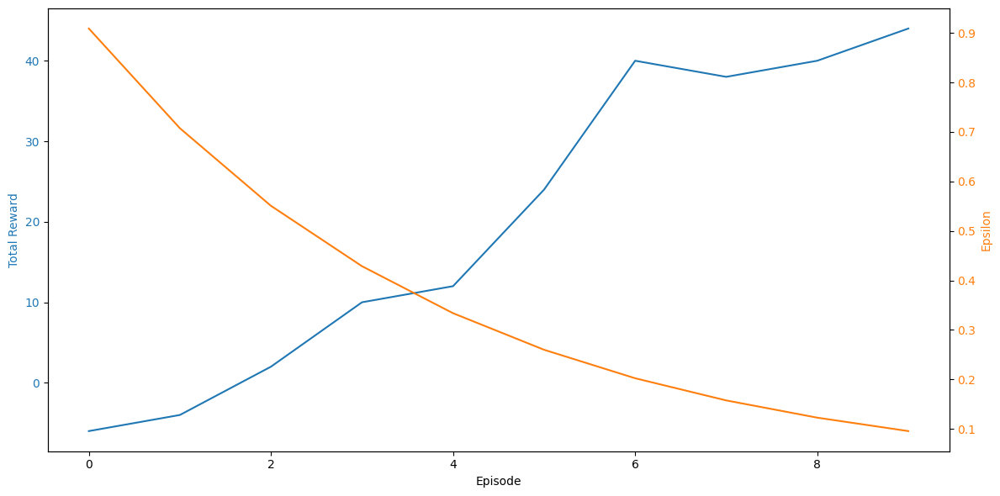

In [35]:
env = BitcoinEnv(train_data)
state_size = len(FEATURES)
action_size = len(ACTIONS)
agent = DQNAgent(q_architecture=SimpleDQN, state_size=state_size, action_size=action_size)


rewards_per_episode, epsilon_per_episode, trained_agent = train_dqn(agent=agent, env=env, n_episodes=10, steps_per_episode=50)

## Hyperparameter fine-tuning

In [18]:
import csv
import numpy as np
import os

def hyperparameter_tuning(data, architectures, hyperparameters, n_episodes=30, steps_per_episode=200, save_dir=join(PathConfig.experiment_results_path.value,'dqn_agent')):
    best_combination = None
    best_reward = -float('inf')
    results = []

    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    csv_file = os.path.join(save_dir, 'agent_tuning_results.csv')
    with open(csv_file, mode='w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(['Index', 'Architecture', 'Hyperparameters', 'Average Reward', 'Average Epsilon'])

        for arch_name, arch in architectures.items():
            for index, params in enumerate(hyperparameters):
                print(f"Training with architecture: {arch_name} and hyperparameters: {params}")
                
                env = BitcoinEnv(data)
                state_size = len(FEATURES)
                action_size = len(ACTIONS)
                agent = DQNAgent(
                    q_architecture=arch,
                    state_size=state_size,
                    action_size=action_size,
                    gamma=params['gamma'],
                    epsilon=params['epsilon'],
                    epsilon_min=params['epsilon_min'],
                    epsilon_decay=params['epsilon_decay'],
                    lr=params['lr'],
                    memory_size=params['memory_size'],
                )
                
                agent.model = arch(state_size, action_size)
                agent.target_model = arch(state_size, action_size)
                agent.update_target_model()

                rewards_per_episode, epsilon_per_episode, _ = train_dqn(agent=agent, env=env, n_episodes=n_episodes, steps_per_episode=steps_per_episode, plot_path=join(save_dir, f'{arch_name}_{index}_.png'))

                avg_reward = np.mean(rewards_per_episode)
                avg_epsilon = np.mean(epsilon_per_episode)
                results.append((index, arch_name, params, avg_reward, avg_epsilon))

                writer.writerow([index, arch_name, params, avg_reward, avg_epsilon])

                if avg_reward > best_reward:
                    best_reward = avg_reward
                    best_combination = (arch_name, params)

    return best_combination, results


architectures = {
    'SimpleDQN': SimpleDQN,
    'ComplexDQN': ComplexDQN
}

hyperparameters = [
    {'gamma': 0.99, 'epsilon': 1.0, 'epsilon_min': 0.01, 'epsilon_decay': 0.995, 'lr': 0.001, 'memory_size': 10000},
    {'gamma': 0.9, 'epsilon': 1.0, 'epsilon_min': 0.01, 'epsilon_decay': 0.99, 'lr': 0.0005, 'memory_size': 5000},
    {'gamma': 0.95, 'epsilon': 1.0, 'epsilon_min': 0.01, 'epsilon_decay': 0.98, 'lr': 0.0007, 'memory_size': 7000},
    {'gamma': 0.98, 'epsilon': 1.0, 'epsilon_min': 0.02, 'epsilon_decay': 0.995, 'lr': 0.001, 'memory_size': 8000},
    {'gamma': 0.99, 'epsilon': 1.0, 'epsilon_min': 0.005, 'epsilon_decay': 0.999, 'lr': 0.0003, 'memory_size': 12000},
    {'gamma': 0.95, 'epsilon': 1.0, 'epsilon_min': 0.02, 'epsilon_decay': 0.98, 'lr': 0.0005, 'memory_size': 6000},
    {'gamma': 0.9, 'epsilon': 1.0, 'epsilon_min': 0.015, 'epsilon_decay': 0.995, 'lr': 0.001, 'memory_size': 10000},
    {'gamma': 0.99, 'epsilon': 1.0, 'epsilon_min': 0.01, 'epsilon_decay': 0.997, 'lr': 0.0008, 'memory_size': 11000},
]

Training with architecture: SimpleDQN and hyperparameters: {'gamma': 0.99, 'epsilon': 1.0, 'epsilon_min': 0.01, 'epsilon_decay': 0.995, 'lr': 0.001, 'memory_size': 10000}
Episode: 1/30, Step: 1, Action: increase, Reward: 1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 2, Action: decrease, Reward: -1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 3, Action: increase, Reward: 1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 4, Action: increase, Reward: -1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 5, Action: increase, Reward: 1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 6, Action: decrease, Reward: 1, Total Reward: 2, Epsilon: 1.00
Episode: 1/30, Step: 7, Action: decrease, Reward: 1, Total Reward: 3, Epsilon: 1.00
Episode: 1/30, Step: 8, Action: decrease, Reward: 1, Total Reward: 4, Epsilon: 1.00
Episode: 1/30, Step: 9, Action: increase, Reward: -1, Total Reward: 3, Epsilon: 1.00
Episode: 1/30, Step: 10, Action: decrease, Reward: -1, Total Reward: 2

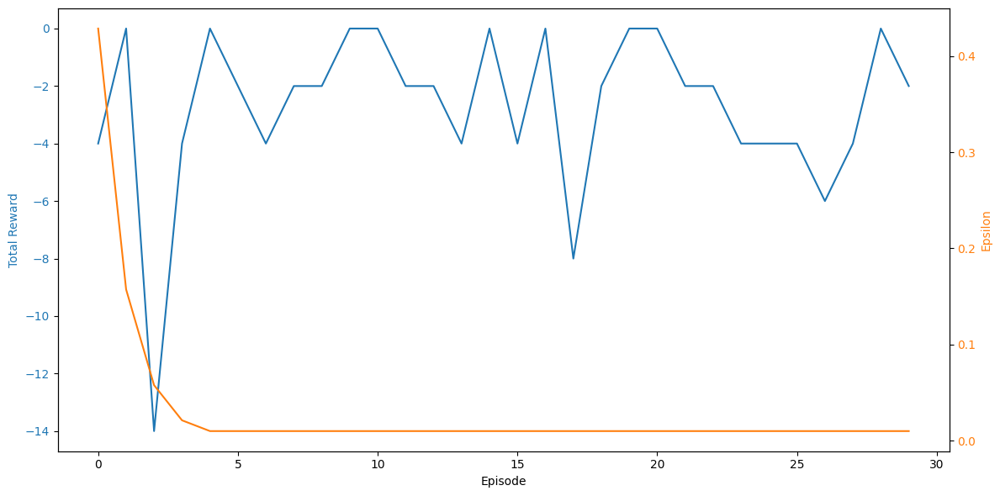

Training with architecture: SimpleDQN and hyperparameters: {'gamma': 0.9, 'epsilon': 1.0, 'epsilon_min': 0.01, 'epsilon_decay': 0.99, 'lr': 0.0005, 'memory_size': 5000}
Episode: 1/30, Step: 1, Action: decrease, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 2, Action: decrease, Reward: -1, Total Reward: -2, Epsilon: 1.00
Episode: 1/30, Step: 3, Action: decrease, Reward: -1, Total Reward: -3, Epsilon: 1.00
Episode: 1/30, Step: 4, Action: decrease, Reward: 1, Total Reward: -2, Epsilon: 1.00
Episode: 1/30, Step: 5, Action: decrease, Reward: -1, Total Reward: -3, Epsilon: 1.00
Episode: 1/30, Step: 6, Action: increase, Reward: -1, Total Reward: -4, Epsilon: 1.00
Episode: 1/30, Step: 7, Action: decrease, Reward: 1, Total Reward: -3, Epsilon: 1.00
Episode: 1/30, Step: 8, Action: increase, Reward: -1, Total Reward: -4, Epsilon: 1.00
Episode: 1/30, Step: 9, Action: increase, Reward: -1, Total Reward: -5, Epsilon: 1.00
Episode: 1/30, Step: 10, Action: decrease, Reward: -1, Tota

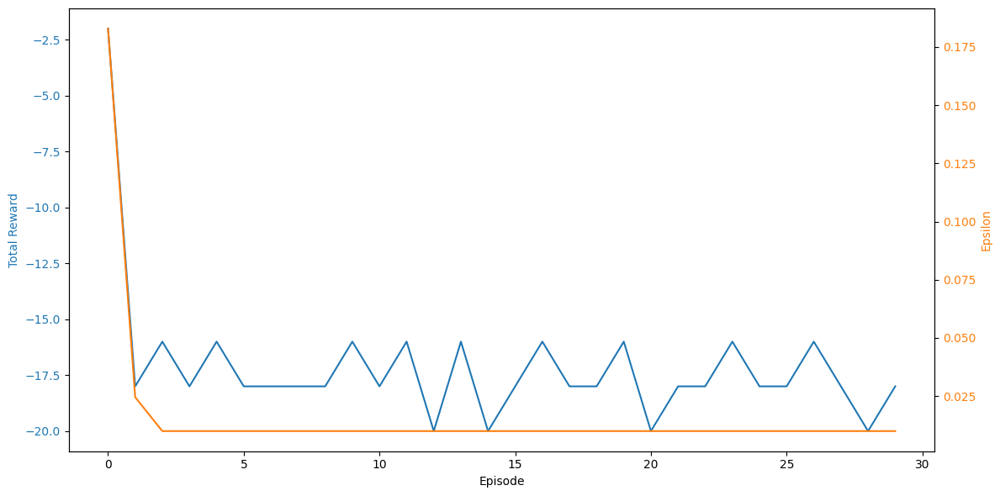

Training with architecture: SimpleDQN and hyperparameters: {'gamma': 0.95, 'epsilon': 1.0, 'epsilon_min': 0.01, 'epsilon_decay': 0.98, 'lr': 0.0007, 'memory_size': 7000}
Episode: 1/30, Step: 1, Action: increase, Reward: 1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 2, Action: decrease, Reward: -1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 3, Action: decrease, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 4, Action: decrease, Reward: 1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 5, Action: increase, Reward: 1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 6, Action: decrease, Reward: 1, Total Reward: 2, Epsilon: 1.00
Episode: 1/30, Step: 7, Action: increase, Reward: -1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 8, Action: increase, Reward: -1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 9, Action: increase, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 10, Action: increase, Reward: 1, Total Reward:

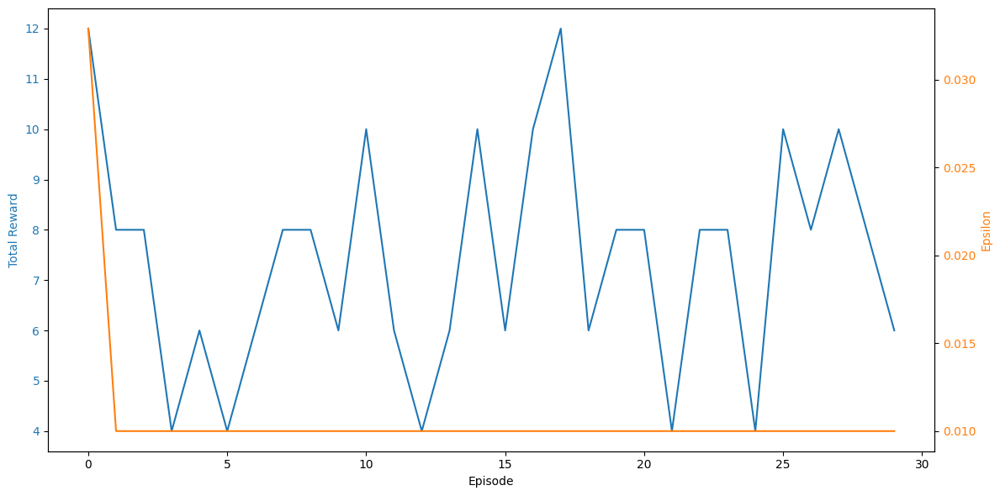

Training with architecture: SimpleDQN and hyperparameters: {'gamma': 0.98, 'epsilon': 1.0, 'epsilon_min': 0.02, 'epsilon_decay': 0.995, 'lr': 0.001, 'memory_size': 8000}
Episode: 1/30, Step: 1, Action: decrease, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 2, Action: increase, Reward: 1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 3, Action: increase, Reward: 1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 4, Action: decrease, Reward: 1, Total Reward: 2, Epsilon: 1.00
Episode: 1/30, Step: 5, Action: decrease, Reward: -1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 6, Action: decrease, Reward: 1, Total Reward: 2, Epsilon: 1.00
Episode: 1/30, Step: 7, Action: increase, Reward: -1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 8, Action: decrease, Reward: 1, Total Reward: 2, Epsilon: 1.00
Episode: 1/30, Step: 9, Action: increase, Reward: -1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 10, Action: increase, Reward: 1, Total Reward: 2

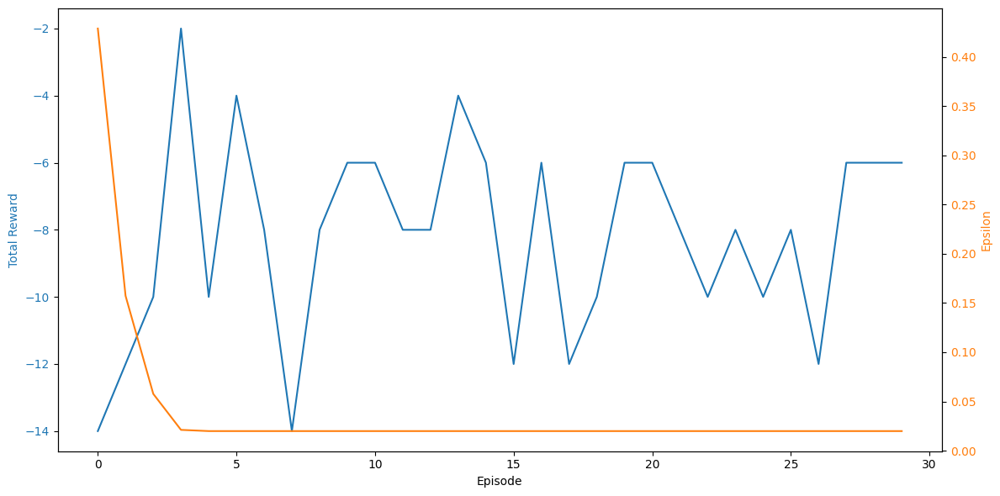

Training with architecture: SimpleDQN and hyperparameters: {'gamma': 0.99, 'epsilon': 1.0, 'epsilon_min': 0.005, 'epsilon_decay': 0.999, 'lr': 0.0003, 'memory_size': 12000}
Episode: 1/30, Step: 1, Action: increase, Reward: 1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 2, Action: decrease, Reward: -1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 3, Action: decrease, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 4, Action: decrease, Reward: 1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 5, Action: increase, Reward: 1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 6, Action: increase, Reward: -1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 7, Action: increase, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 8, Action: increase, Reward: -1, Total Reward: -2, Epsilon: 1.00
Episode: 1/30, Step: 9, Action: increase, Reward: -1, Total Reward: -3, Epsilon: 1.00
Episode: 1/30, Step: 10, Action: decrease, Reward: -1, Total 

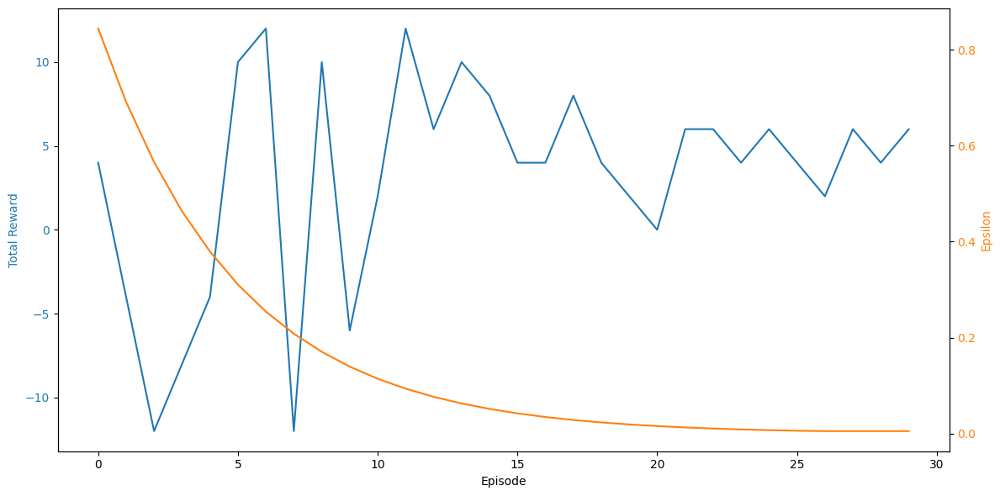

Training with architecture: SimpleDQN and hyperparameters: {'gamma': 0.95, 'epsilon': 1.0, 'epsilon_min': 0.02, 'epsilon_decay': 0.98, 'lr': 0.0005, 'memory_size': 6000}
Episode: 1/30, Step: 1, Action: increase, Reward: 1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 2, Action: increase, Reward: 1, Total Reward: 2, Epsilon: 1.00
Episode: 1/30, Step: 3, Action: decrease, Reward: -1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 4, Action: decrease, Reward: 1, Total Reward: 2, Epsilon: 1.00
Episode: 1/30, Step: 5, Action: decrease, Reward: -1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 6, Action: increase, Reward: -1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 7, Action: increase, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 8, Action: decrease, Reward: 1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 9, Action: decrease, Reward: 1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 10, Action: decrease, Reward: -1, Total Reward: 

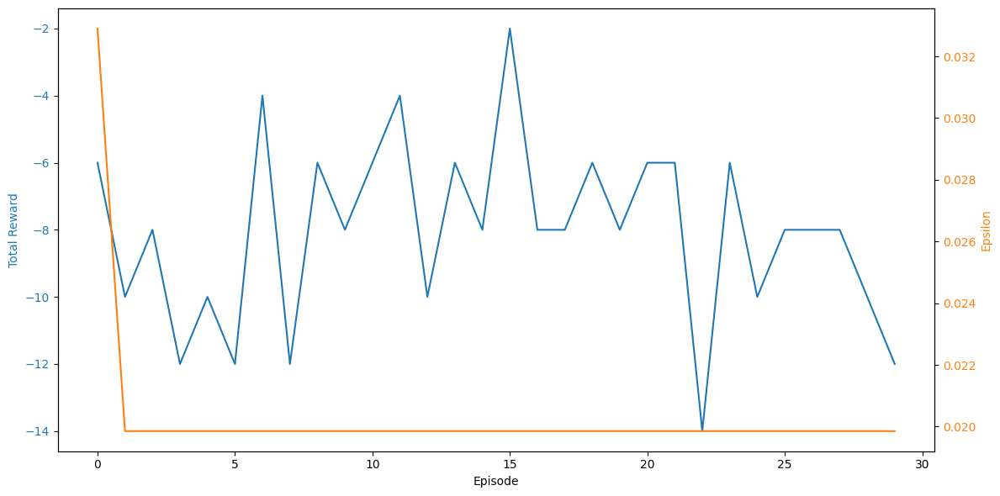

Training with architecture: SimpleDQN and hyperparameters: {'gamma': 0.9, 'epsilon': 1.0, 'epsilon_min': 0.015, 'epsilon_decay': 0.995, 'lr': 0.001, 'memory_size': 10000}
Episode: 1/30, Step: 1, Action: increase, Reward: 1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 2, Action: increase, Reward: 1, Total Reward: 2, Epsilon: 1.00
Episode: 1/30, Step: 3, Action: increase, Reward: 1, Total Reward: 3, Epsilon: 1.00
Episode: 1/30, Step: 4, Action: decrease, Reward: 1, Total Reward: 4, Epsilon: 1.00
Episode: 1/30, Step: 5, Action: decrease, Reward: -1, Total Reward: 3, Epsilon: 1.00
Episode: 1/30, Step: 6, Action: decrease, Reward: 1, Total Reward: 4, Epsilon: 1.00
Episode: 1/30, Step: 7, Action: decrease, Reward: 1, Total Reward: 5, Epsilon: 1.00
Episode: 1/30, Step: 8, Action: increase, Reward: -1, Total Reward: 4, Epsilon: 1.00
Episode: 1/30, Step: 9, Action: increase, Reward: -1, Total Reward: 3, Epsilon: 1.00
Episode: 1/30, Step: 10, Action: decrease, Reward: -1, Total Reward: 2

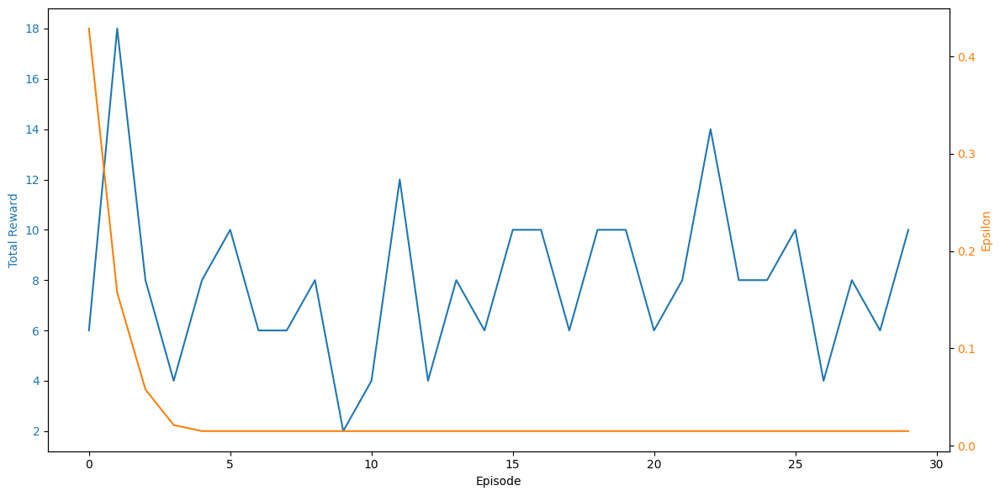

Training with architecture: SimpleDQN and hyperparameters: {'gamma': 0.99, 'epsilon': 1.0, 'epsilon_min': 0.01, 'epsilon_decay': 0.997, 'lr': 0.0008, 'memory_size': 11000}
Episode: 1/30, Step: 1, Action: increase, Reward: 1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 2, Action: decrease, Reward: -1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 3, Action: decrease, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 4, Action: decrease, Reward: 1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 5, Action: decrease, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 6, Action: decrease, Reward: 1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 7, Action: increase, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 8, Action: decrease, Reward: 1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 9, Action: increase, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 10, Action: increase, Reward: 1, Total Rew

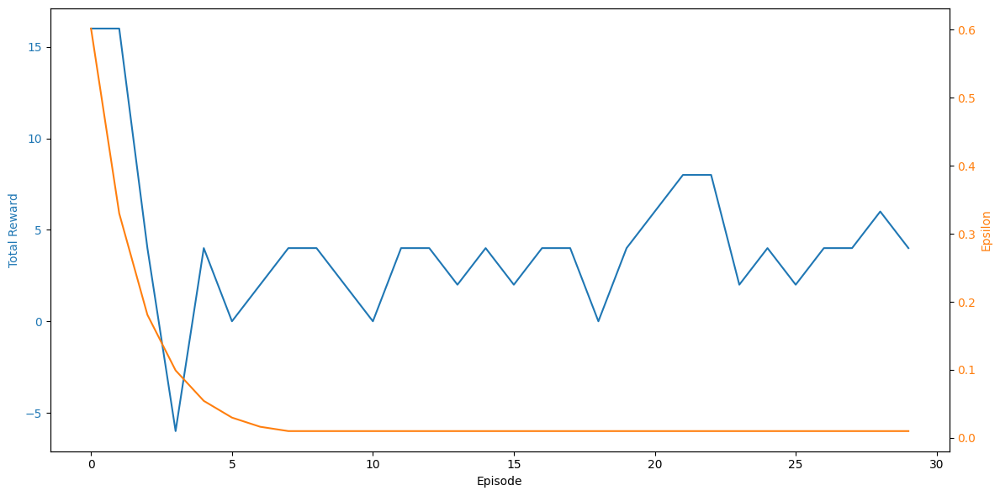

Training with architecture: ComplexDQN and hyperparameters: {'gamma': 0.99, 'epsilon': 1.0, 'epsilon_min': 0.01, 'epsilon_decay': 0.995, 'lr': 0.001, 'memory_size': 10000}
Episode: 1/30, Step: 1, Action: increase, Reward: 1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 2, Action: increase, Reward: 1, Total Reward: 2, Epsilon: 1.00
Episode: 1/30, Step: 3, Action: increase, Reward: 1, Total Reward: 3, Epsilon: 1.00
Episode: 1/30, Step: 4, Action: decrease, Reward: 1, Total Reward: 4, Epsilon: 1.00
Episode: 1/30, Step: 5, Action: increase, Reward: 1, Total Reward: 5, Epsilon: 1.00
Episode: 1/30, Step: 6, Action: increase, Reward: -1, Total Reward: 4, Epsilon: 1.00
Episode: 1/30, Step: 7, Action: decrease, Reward: 1, Total Reward: 5, Epsilon: 1.00
Episode: 1/30, Step: 8, Action: decrease, Reward: 1, Total Reward: 6, Epsilon: 1.00
Episode: 1/30, Step: 9, Action: decrease, Reward: 1, Total Reward: 7, Epsilon: 1.00
Episode: 1/30, Step: 10, Action: increase, Reward: 1, Total Reward: 8, 

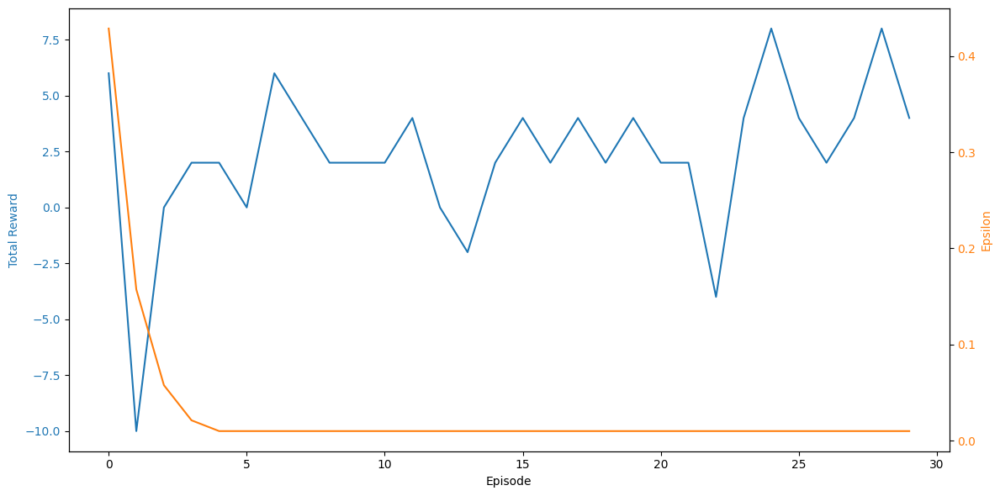

Training with architecture: ComplexDQN and hyperparameters: {'gamma': 0.9, 'epsilon': 1.0, 'epsilon_min': 0.01, 'epsilon_decay': 0.99, 'lr': 0.0005, 'memory_size': 5000}
Episode: 1/30, Step: 1, Action: decrease, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 2, Action: increase, Reward: 1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 3, Action: decrease, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 4, Action: decrease, Reward: 1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 5, Action: decrease, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 6, Action: increase, Reward: -1, Total Reward: -2, Epsilon: 1.00
Episode: 1/30, Step: 7, Action: decrease, Reward: 1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 8, Action: decrease, Reward: 1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 9, Action: increase, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 10, Action: decrease, Reward: -1, Total Re

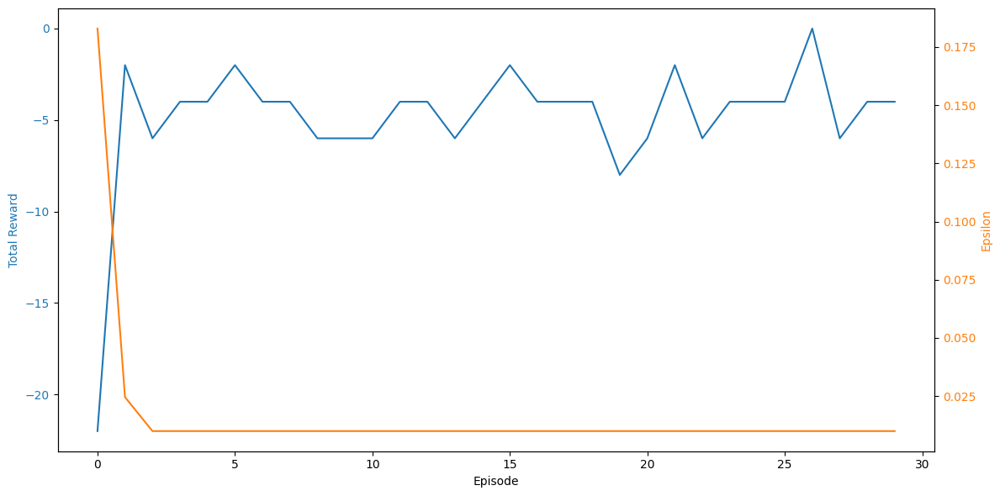

Training with architecture: ComplexDQN and hyperparameters: {'gamma': 0.95, 'epsilon': 1.0, 'epsilon_min': 0.01, 'epsilon_decay': 0.98, 'lr': 0.0007, 'memory_size': 7000}
Episode: 1/30, Step: 1, Action: decrease, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 2, Action: increase, Reward: 1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 3, Action: increase, Reward: 1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 4, Action: increase, Reward: -1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 5, Action: decrease, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 6, Action: increase, Reward: -1, Total Reward: -2, Epsilon: 1.00
Episode: 1/30, Step: 7, Action: increase, Reward: -1, Total Reward: -3, Epsilon: 1.00
Episode: 1/30, Step: 8, Action: decrease, Reward: 1, Total Reward: -2, Epsilon: 1.00
Episode: 1/30, Step: 9, Action: decrease, Reward: 1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 10, Action: decrease, Reward: -1, Total R

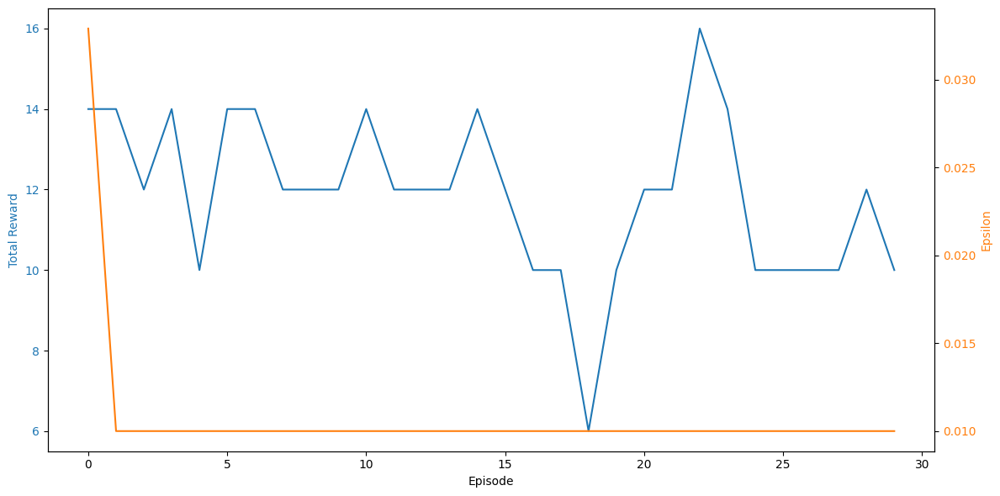

Training with architecture: ComplexDQN and hyperparameters: {'gamma': 0.98, 'epsilon': 1.0, 'epsilon_min': 0.02, 'epsilon_decay': 0.995, 'lr': 0.001, 'memory_size': 8000}
Episode: 1/30, Step: 1, Action: increase, Reward: 1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 2, Action: increase, Reward: 1, Total Reward: 2, Epsilon: 1.00
Episode: 1/30, Step: 3, Action: increase, Reward: 1, Total Reward: 3, Epsilon: 1.00
Episode: 1/30, Step: 4, Action: increase, Reward: -1, Total Reward: 2, Epsilon: 1.00
Episode: 1/30, Step: 5, Action: decrease, Reward: -1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 6, Action: increase, Reward: -1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 7, Action: increase, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 8, Action: increase, Reward: -1, Total Reward: -2, Epsilon: 1.00
Episode: 1/30, Step: 9, Action: increase, Reward: -1, Total Reward: -3, Epsilon: 1.00
Episode: 1/30, Step: 10, Action: decrease, Reward: -1, Total Rew

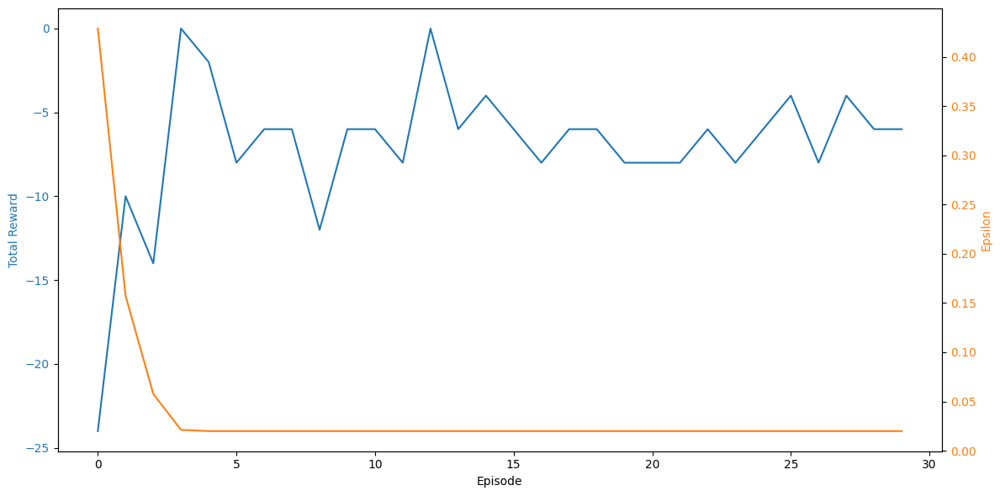

Training with architecture: ComplexDQN and hyperparameters: {'gamma': 0.99, 'epsilon': 1.0, 'epsilon_min': 0.005, 'epsilon_decay': 0.999, 'lr': 0.0003, 'memory_size': 12000}
Episode: 1/30, Step: 1, Action: increase, Reward: 1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 2, Action: decrease, Reward: -1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 3, Action: increase, Reward: 1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 4, Action: increase, Reward: -1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 5, Action: decrease, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 6, Action: decrease, Reward: 1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 7, Action: increase, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 8, Action: increase, Reward: -1, Total Reward: -2, Epsilon: 1.00
Episode: 1/30, Step: 9, Action: decrease, Reward: 1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 10, Action: increase, Reward: 1, Total R

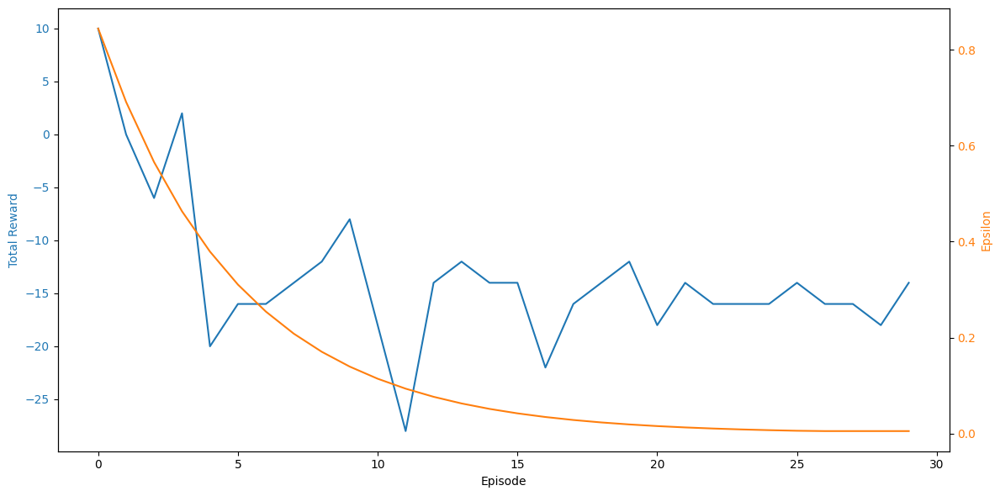

Training with architecture: ComplexDQN and hyperparameters: {'gamma': 0.95, 'epsilon': 1.0, 'epsilon_min': 0.02, 'epsilon_decay': 0.98, 'lr': 0.0005, 'memory_size': 6000}
Episode: 1/30, Step: 1, Action: decrease, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 2, Action: increase, Reward: 1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 3, Action: decrease, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 4, Action: decrease, Reward: 1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 5, Action: increase, Reward: 1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 6, Action: increase, Reward: -1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 7, Action: decrease, Reward: 1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 8, Action: increase, Reward: -1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 9, Action: decrease, Reward: 1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 10, Action: decrease, Reward: -1, Total Reward

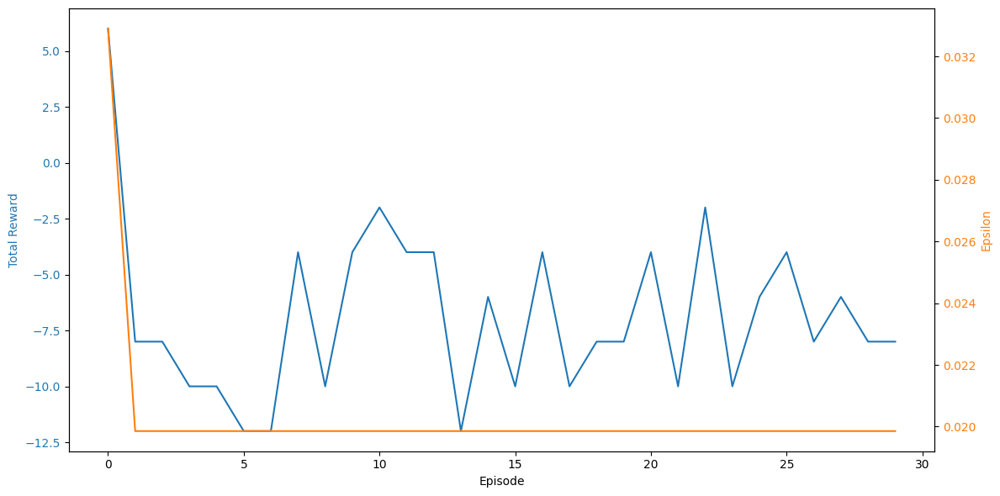

Training with architecture: ComplexDQN and hyperparameters: {'gamma': 0.9, 'epsilon': 1.0, 'epsilon_min': 0.015, 'epsilon_decay': 0.995, 'lr': 0.001, 'memory_size': 10000}
Episode: 1/30, Step: 1, Action: decrease, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 2, Action: decrease, Reward: -1, Total Reward: -2, Epsilon: 1.00
Episode: 1/30, Step: 3, Action: decrease, Reward: -1, Total Reward: -3, Epsilon: 1.00
Episode: 1/30, Step: 4, Action: decrease, Reward: 1, Total Reward: -2, Epsilon: 1.00
Episode: 1/30, Step: 5, Action: decrease, Reward: -1, Total Reward: -3, Epsilon: 1.00
Episode: 1/30, Step: 6, Action: increase, Reward: -1, Total Reward: -4, Epsilon: 1.00
Episode: 1/30, Step: 7, Action: decrease, Reward: 1, Total Reward: -3, Epsilon: 1.00
Episode: 1/30, Step: 8, Action: decrease, Reward: 1, Total Reward: -2, Epsilon: 1.00
Episode: 1/30, Step: 9, Action: decrease, Reward: 1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 10, Action: increase, Reward: 1, Tota

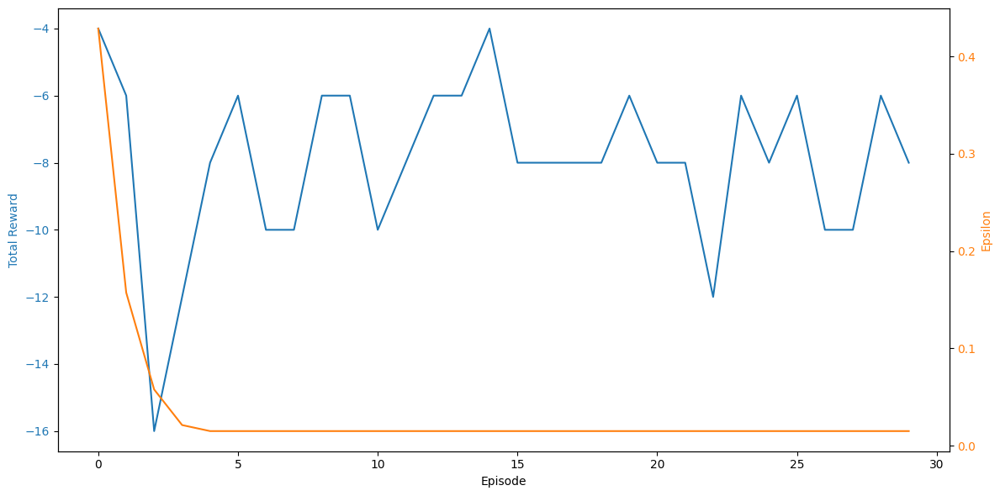

Training with architecture: ComplexDQN and hyperparameters: {'gamma': 0.99, 'epsilon': 1.0, 'epsilon_min': 0.01, 'epsilon_decay': 0.997, 'lr': 0.0008, 'memory_size': 11000}
Episode: 1/30, Step: 1, Action: decrease, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 2, Action: increase, Reward: 1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 3, Action: increase, Reward: 1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 4, Action: increase, Reward: -1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 5, Action: increase, Reward: 1, Total Reward: 1, Epsilon: 1.00
Episode: 1/30, Step: 6, Action: increase, Reward: -1, Total Reward: 0, Epsilon: 1.00
Episode: 1/30, Step: 7, Action: increase, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/30, Step: 8, Action: increase, Reward: -1, Total Reward: -2, Epsilon: 1.00
Episode: 1/30, Step: 9, Action: increase, Reward: -1, Total Reward: -3, Epsilon: 1.00
Episode: 1/30, Step: 10, Action: increase, Reward: 1, Total R

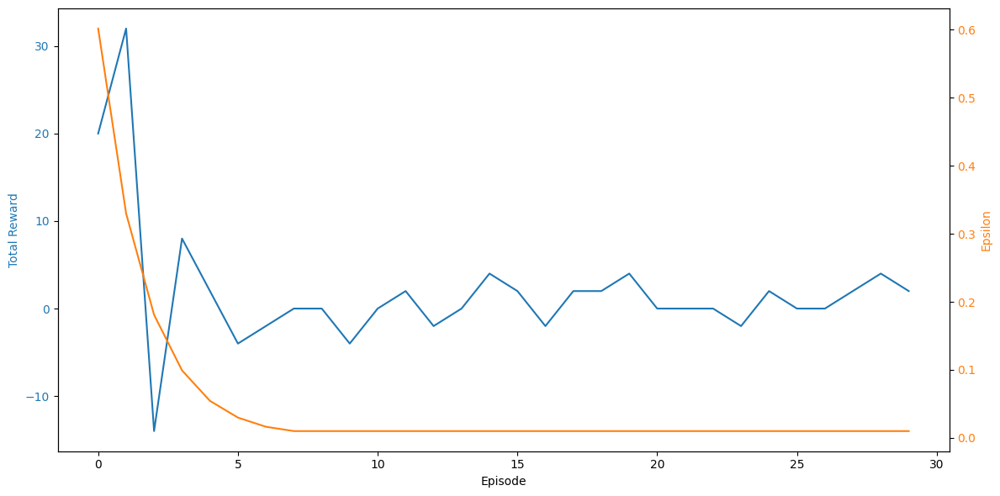

Best combination: ('ComplexDQN', {'gamma': 0.95, 'epsilon': 1.0, 'epsilon_min': 0.01, 'epsilon_decay': 0.98, 'lr': 0.0007, 'memory_size': 7000})
All results:
(0, 'SimpleDQN', {'gamma': 0.99, 'epsilon': 1.0, 'epsilon_min': 0.01, 'epsilon_decay': 0.995, 'lr': 0.001, 'memory_size': 10000}, -2.7333333333333334, 0.030816442623440746)
(1, 'SimpleDQN', {'gamma': 0.9, 'epsilon': 1.0, 'epsilon_min': 0.01, 'epsilon_decay': 0.99, 'lr': 0.0005, 'memory_size': 5000}, -17.133333333333333, 0.016175208359146338)
(2, 'SimpleDQN', {'gamma': 0.95, 'epsilon': 1.0, 'epsilon_min': 0.01, 'epsilon_decay': 0.98, 'lr': 0.0007, 'memory_size': 7000}, 7.4, 0.010753244343802041)
(3, 'SimpleDQN', {'gamma': 0.98, 'epsilon': 1.0, 'epsilon_min': 0.02, 'epsilon_decay': 0.995, 'lr': 0.001, 'memory_size': 8000}, -8.2, 0.039446866949630795)
(4, 'SimpleDQN', {'gamma': 0.99, 'epsilon': 1.0, 'epsilon_min': 0.005, 'epsilon_decay': 0.999, 'lr': 0.0003, 'memory_size': 12000}, 3.1333333333333333, 0.1550246452140393)
(5, 'SimpleDQ

In [19]:
best_combination, results = hyperparameter_tuning(data=train_data, architectures=architectures, hyperparameters=hyperparameters, n_episodes=30, steps_per_episode=200)

print(f"Best combination: {best_combination}")
print("All results:")
for result in results:
    print(result)

#### Best combination: ('ComplexDQN', {'gamma': 0.95, 'epsilon': 1.0, 'epsilon_min': 0.01, 'epsilon_decay': 0.98, 'lr': 0.0007, 'memory_size': 7000})

## Trading Environment

In [34]:
class TradingEnv:
    def __init__(self, data, initial_investment=10000):
        self.data = data
        self.initial_investment = initial_investment
        self.current_step = 0
        self.current_investment = initial_investment
        self.current_position = None  # None means no position, 'long' means holding Bitcoin, 'short' means betting against Bitcoin
    
    def reset(self):
        self.current_step = 0
        self.current_investment = self.initial_investment
        self.current_position = None
        return self.get_state()
    
    def step(self, action):
        reward, done = self.get_reward(action)
        self.current_step += 1
        next_state = self.get_state()
        return next_state, reward, done
    
    def get_state(self):
        if self.current_step >= len(self.data):
            self.current_step = len(self.data) - 1
        state = self.data.iloc[self.current_step][FEATURES].values.astype(np.float32)
        return state
    
    def get_reward(self, action):
        current_price = self.data.iloc[self.current_step]['close']
        if self.current_step < len(self.data) - 1:
            next_price = self.data.iloc[self.current_step + 1]['close']
        else:
            next_price = current_price
        
        price_change = (next_price - current_price) / current_price
        reward = 0
        
        if action == 0:  # 'increase' -> buy or hold
            if self.current_position == 'long':
                reward = self.current_investment * price_change
            elif self.current_position == 'short':
                reward = -self.current_investment * price_change
            else:
                self.current_position = 'long'
        elif action == 1:  # 'decrease' -> sell or short
            if self.current_position == 'long':
                reward = -self.current_investment * price_change
            elif self.current_position == 'short':
                reward = self.current_investment * price_change
            else:
                self.current_position = 'short'
        
        self.current_investment += reward
        done = self.current_step >= len(self.data) - 1
        return reward, done

Episode: 1/60, Step: 1, Action: decrease, Reward: -1, Total Reward: -1, Epsilon: 1.00
Episode: 1/60, Step: 2, Action: decrease, Reward: -1, Total Reward: -2, Epsilon: 1.00
Episode: 1/60, Step: 3, Action: decrease, Reward: -1, Total Reward: -3, Epsilon: 1.00
Episode: 1/60, Step: 4, Action: decrease, Reward: 1, Total Reward: -2, Epsilon: 1.00
Episode: 1/60, Step: 5, Action: decrease, Reward: -1, Total Reward: -3, Epsilon: 1.00
Episode: 1/60, Step: 6, Action: decrease, Reward: 1, Total Reward: -2, Epsilon: 1.00
Episode: 1/60, Step: 7, Action: increase, Reward: -1, Total Reward: -3, Epsilon: 1.00
Episode: 1/60, Step: 8, Action: decrease, Reward: 1, Total Reward: -2, Epsilon: 1.00
Episode: 1/60, Step: 9, Action: increase, Reward: -1, Total Reward: -3, Epsilon: 1.00
Episode: 1/60, Step: 10, Action: increase, Reward: 1, Total Reward: -2, Epsilon: 1.00
Episode: 1/60, Step: 11, Action: decrease, Reward: -1, Total Reward: -3, Epsilon: 1.00
Episode: 1/60, Step: 12, Action: increase, Reward: 1, To

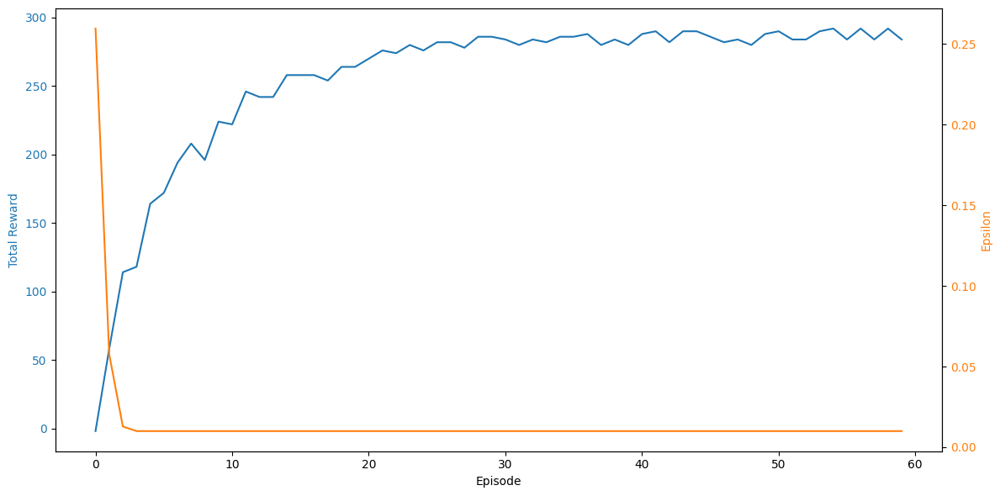

In [60]:
env = BitcoinEnv(train_data)
state_size = len(FEATURES)
action_size = len(ACTIONS)

agent = DQNAgent(
                    q_architecture=ComplexDQN,
                    state_size=state_size,
                    action_size=action_size,
                    gamma=0.95,
                    epsilon=1.0,
                    epsilon_min=0.01,
                    epsilon_decay=0.999,
                    lr=0.0007,
                    memory_size=7000,
                )


agent = DQNAgent(q_architecture=SimpleDQN, state_size=state_size, action_size=action_size)

# Train the agent and collect metrics
rewards_per_episode, epsilon_per_episode, trained_agent = train_dqn(agent=agent, env=env, n_episodes=60, steps_per_episode=300)

In [61]:
import joblib

class TradingEnv:
    def __init__(self, data, initial_investment=10000):
        self.scaler = joblib.load(join(PathConfig.base_data_path.value, 'scaler.pkl'))
        self.columns = data.columns
        self.data = pd.DataFrame(self.scaler.inverse_transform(data), columns=self.columns)
        self.initial_investment = initial_investment
        self.current_step = 0
        self.current_investment = initial_investment
        self.current_position = None  # None means no position, 'long' means holding Bitcoin, 'short' means betting against Bitcoin
    
    def reset(self):
        self.current_step = 0
        self.current_investment = self.initial_investment
        self.current_position = None
        return self.get_state()
    
    def step(self, action):
        reward, done = self.get_reward(action)
        self.current_step += 1
        next_state = self.get_state()
        return next_state, reward, done
    
    def get_state(self):
        if self.current_step >= len(self.data):
            self.current_step = len(self.data) - 1
        state = self.data.iloc[self.current_step][FEATURES].values.astype(np.float32)
        return state
    
    def get_reward(self, action):
        current_price = self.data.iloc[self.current_step]['close']
        if self.current_step < len(self.data) - 1:
            next_price = self.data.iloc[self.current_step + 1]['close']
        else:
            next_price = current_price
                
        price_change = (next_price - current_price) / current_price
        reward = 0
        
        if action == 0:  # 'increase' -> buy or hold
            if self.current_position == 'long':
                reward = self.current_investment * price_change
            elif self.current_position == 'short':
                reward = -self.current_investment * price_change
            else:
                self.current_position = 'long'
        elif action == 1:  # 'decrease' -> sell or short
            if self.current_position == 'long':
                reward = -self.current_investment * price_change
            elif self.current_position == 'short':
                reward = self.current_investment * price_change
            else:
                self.current_position = 'short'
        
        self.current_investment += reward
        done = self.current_step >= len(self.data) - 1
        return reward, done

Initial Portfolio Value: $10000.00
Final Portfolio Value: $11818.47
Total Profit: $1818.47


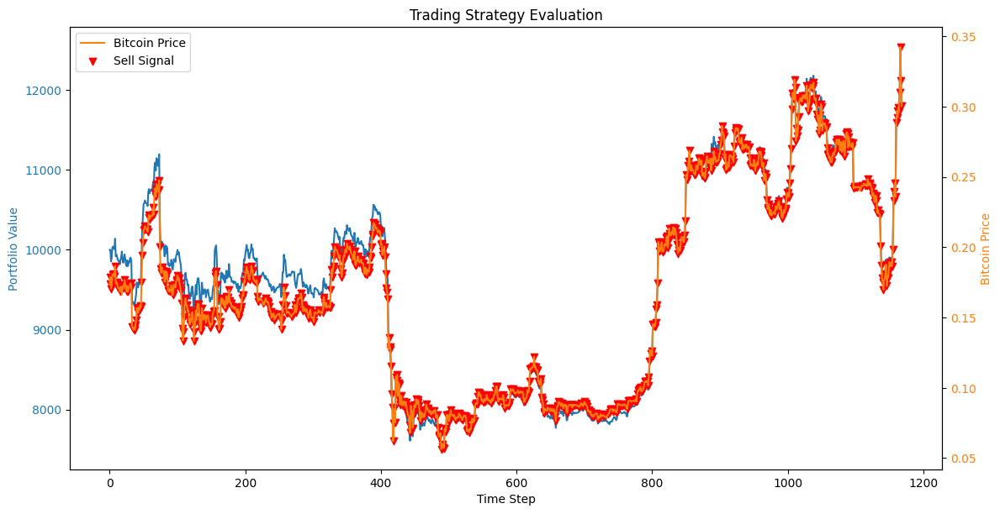

Total Profit: $1818.47


In [64]:
from matplotlib.pylab import f
import matplotlib.pyplot as plt

def evaluate_trading_strategy(agent, test_data, initial_investment=10000):
    env = TradingEnv(test_data, initial_investment)
    state = env.reset()
    total_profit = 0
    portfolio_values = [initial_investment]
    actions_taken = []

    while True:
        action = agent.act(state)
        actions_taken.append(action)
        next_state, reward, done = env.step(action)
        state = next_state
        total_profit += reward
        portfolio_values.append(env.current_investment)
        
        if done:
            break
    
    print(f"Initial Portfolio Value: ${initial_investment:.2f}")
    print(f"Final Portfolio Value: ${env.current_investment:.2f}")
    print(f"Total Profit: ${total_profit:.2f}")
    
    plot_trading_results(portfolio_values, actions_taken, test_data['close'])
    
    return total_profit

def plot_trading_results(portfolio_values, actions_taken, prices):
    fig, ax1 = plt.subplots(figsize=(12, 6))

    ax1.set_xlabel('Time Step')
    ax1.set_ylabel('Portfolio Value', color='tab:blue')
    ax1.plot(portfolio_values, label='Portfolio Value', color='tab:blue')
    ax1.tick_params(axis='y', labelcolor='tab:blue')

    ax2 = ax1.twinx()
    ax2.set_ylabel('Bitcoin Price', color='tab:orange')
    ax2.plot(prices, label='Bitcoin Price', color='tab:orange')
    ax2.tick_params(axis='y', labelcolor='tab:orange')

    # buy_signals = [i for i, action in enumerate(actions_taken) if action == 0]
    sell_signals = [i for i, action in enumerate(actions_taken) if action == 1]

    # buy_offsets = [i - 0.2 for i in buy_signals]
    sell_offsets = [i + 0.2 for i in sell_signals]

    # ax2.scatter(buy_offsets, [prices[i] for i in buy_signals], label='Buy Signal', marker='^', color='green')
    ax2.scatter(sell_offsets, [prices[i] for i in sell_signals], label='Sell Signal', marker='v', color='red')

    fig.tight_layout()
    plt.legend()
    plt.title('Trading Strategy Evaluation')
    plt.show()

total_profit = evaluate_trading_strategy(agent=trained_agent, test_data=data_preprocessor.test_data)
print(f"Total Profit: ${total_profit:.2f}")

